In [ ]:
%load_ext autoreload
%autoreload 2

# Chronic registration demo

This notebook gives a basic demonstration of registering 10-minute segments from 5 sessions recorded in a single implantation (AL032, with thanks to Anna Lebedeva; see Steinmetz et al., _Neuropixels 2.0: ..._, Science 2021).

The steps are:
 - Preprocessing and combining recordings with SpikeInterface
 - Detecting and localizing spikes with DARTsort tools
 - Running DREDge
 - Visualize results

Each step can be replaced by another equivalent choice.
If you prefer to do preprocessing externally, you can import the result of your preprocessing with the SpikeInterface function `read_binary(...)` for input into DARTsort. Alternatively, you could use SpikeInterface tools (see their "peaks pipeline") to detect and localize spikes. Finally, DREDge takes as input arrays of spike times, positions, and amplitudes, so you could compute those elsewhere as well.

For info on installing spikeinterface and DARTsort, see:
 - https://spikeinterface.readthedocs.io/en/latest/api.html
 - https://github.com/cwindolf/dartsort

In [35]:
import numpy as np
import spikeinterface.full as si
from scipy.io import loadmat
from pathlib import Path
from dartsort import main, config, vis as dartvis
from tqdm.auto import tqdm
from dredge import dredge_ap, motion_util

In [3]:
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
plt.rc("figure", dpi=300)
plt.rc("figure", figsize=(5, 4))
SMALL_SIZE = 7
MEDIUM_SIZE = 7
BIGGER_SIZE =  8
plt.rc('font', size=SMALL_SIZE)
plt.rc('axes', titlesize=MEDIUM_SIZE)
plt.rc('axes', labelsize=SMALL_SIZE)
plt.rc('xtick', labelsize=SMALL_SIZE)
plt.rc('ytick', labelsize=SMALL_SIZE)
plt.rc('legend', fontsize=SMALL_SIZE)
plt.rc('figure', titlesize=BIGGER_SIZE)

## Step 0: Paths and configuration

In [8]:
data_dir = Path("/home/charlie/data/jc_lacie_np2_chronic/AL032/")
output_dir = Path("/home/charlie/data/np2_chronic_demo")
output_dir.mkdir(exist_ok=True)

In [9]:
# get all ap binaries using pathlib.Path.glob
ap_bins = list(sorted(data_dir.glob("**/*t0.imec?.ap.bin")))
ap_bins

[PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2019-11-21/ephys/AL032_2019-11-21_stripe192-natIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2019-11-22/ephys/AL032_2019-11-22_stripe192-natIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2019-12-03/ephys/AL032_2019-12-03_stripe192_natIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2019-12-13/ephys/AL032_2019-12-13_stripe192_NatIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2020-01-07/ephys/AL032_2020-01-07_stripe192_NatIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2020-01-16/ephys/AL032_2020-01-16_stripe192_NatIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2020-02-04/ephys/AL032_2020-02-04_stripe192_NatIm_g0_t0.imec0.ap.bin'),
 PosixPath('/home/charlie/data/jc_lacie_np2_chronic/AL032/2020-02-19/ephys/AL032_2020-02-1

In [10]:
# we'll focus on one shank from the first 5 sessions
session_choices = range(5)
shank_choice = 1

In [11]:
# let's use 10 minute segments
snip_length = 10 * 60

In [16]:
# load the probe geometry
ap_chanmap_mat = ap_bins[0].with_suffix("").with_suffix(".ap_kilosortChanMap.mat")
chanmap = loadmat(ap_chanmap_mat)
geom = np.column_stack([chanmap['xcoords'], chanmap['ycoords']])
kcoords = chanmap['kcoords'].squeeze()

## Step 1: Preprocess and combine sessions

Here, we open each recording with spikeinterface, grab one shank, trim to a central time snippet, apply a preprocessing pipeline to each segment, and combine the recordings using `si.concatenate_recordings(...)`. We then write the concatenated recording to disk.

It might be better to preprocess after concatenation -- not sure. Should not make a difference for this purpose.

In [23]:
recordings = []
for session in tqdm(session_choices):
    ap_bin = ap_bins[session]

    # get relevant paths
    # spikeinterface currently has an issue reading SpikeGLX metadata
    # and reads this 4-shank neuropixels probe as a single shank.
    # see: https://github.com/SpikeInterface/probeinterface/issues/192
    rec = si.read_binary(
        ap_bin,
        30_000,
        dtype="int16",
        num_channels=len(geom) + 1,
    )
    # remove sync channel
    rec = rec.channel_slice(rec.channel_ids[:-1])
    # add geometry manually
    rec.set_dummy_probe_from_locations(geom)
    # extract shank
    rec = rec.channel_slice(rec.channel_ids[kcoords == shank_choice])
    
    # slice central snippet
    center_frame = rec.get_num_frames() // 2
    start_frame = int(np.floor(center_frame))
    end_frame = int(np.floor(center_frame + rec.sampling_frequency * snip_length))
    rec = rec.frame_slice(start_frame, end_frame)
    
    # very basic preprocessing
    rec = si.highpass_filter(rec)
    rec = si.common_reference(rec)
    rec = si.zscore(rec, mode="mean+std", num_chunks_per_segment=50)
    
    # store
    recordings.append(rec)

  0%|          | 0/5 [00:00<?, ?it/s]

In [24]:
# join recordings
rec = si.concatenate_recordings(recordings)

In [25]:
# save to disk
if (output_dir / "concatenated").exists():
    rec = si.read_binary_folder(output_dir / "concatenated")
else:
    # you may have better results with other chunking/parallelism arguments
    # see https://spikeinterface.readthedocs.io/en/latest/api.html?highlight=global_job#spikeinterface.core.set_global_job_kwargs
    rec = rec.save_to_folder(
        output_dir / "concatenated", chunk_memory="32M", n_jobs=4
    )

Use cache_folder=/home/charlie/data/np2_chronic_demo/concatenated
write_binary_recording with n_jobs = 4 and chunk_size = 83333


write_binary_recording:   0%|          | 0/1081 [00:00<?, ?it/s]

## Step 2: Detect and localize spikes

In [27]:
# higher than default spike detection threshold
subtraction_config = config.SubtractionConfig(
    detection_thresholds=(12, 10, 8, 6, 5)
)

In [30]:
# this is running on GPU on a NVIDIA 1080
# you may be able to increase n_jobs on a bigger GPU (or on CPU)
spikes, hdf5_path = main.subtract(
    rec,
    output_dir,
    subtraction_config=subtraction_config,
    n_jobs=2,
)

Fit subtraction denoisers 1.0s/it [spk/it=%%%]:   0%|          | 0/40 [00:00<?, ?it/s]

Fit features 1.0s/it [spk/it=%%%]:   0%|          | 0/40 [00:00<?, ?it/s]

Subtraction 1.0s/it [spk/it=%%%]:   0%|          | 0/3000 [00:00<?, ?it/s]

Localization:   0%|          | 0/12 [00:00<?, ?it/s]

## Step 3: Registration

In [32]:
# dartsort spikes can be localized far away due to optimization issues
# for now. so, get rid of the far-away ones.
a = spikes.denoised_amplitudes
t = spikes.times_seconds
z = spikes.point_source_localizations[:, 2]
geom = rec.get_channel_locations()
which = (z > geom[:,1].min() - 50) & (z < geom[:,1].max() + 50)

In [37]:
# increase the number of nonrigid windows for dredge to handle
# the nonrigid motion in this data
motion_est, extra = dredge_ap.register(
    a[which], z[which], t[which], win_step_um=100
)

Cross correlation:   0%|          | 0/4 [00:00<?, ?it/s]

Weights:   0%|          | 0/4 [00:00<?, ?it/s]

Solve:   0%|          | 0/3 [00:00<?, ?it/s]

Text(0.5, 1.0, 'unregistered spike depths vs. time, with motion estimate')

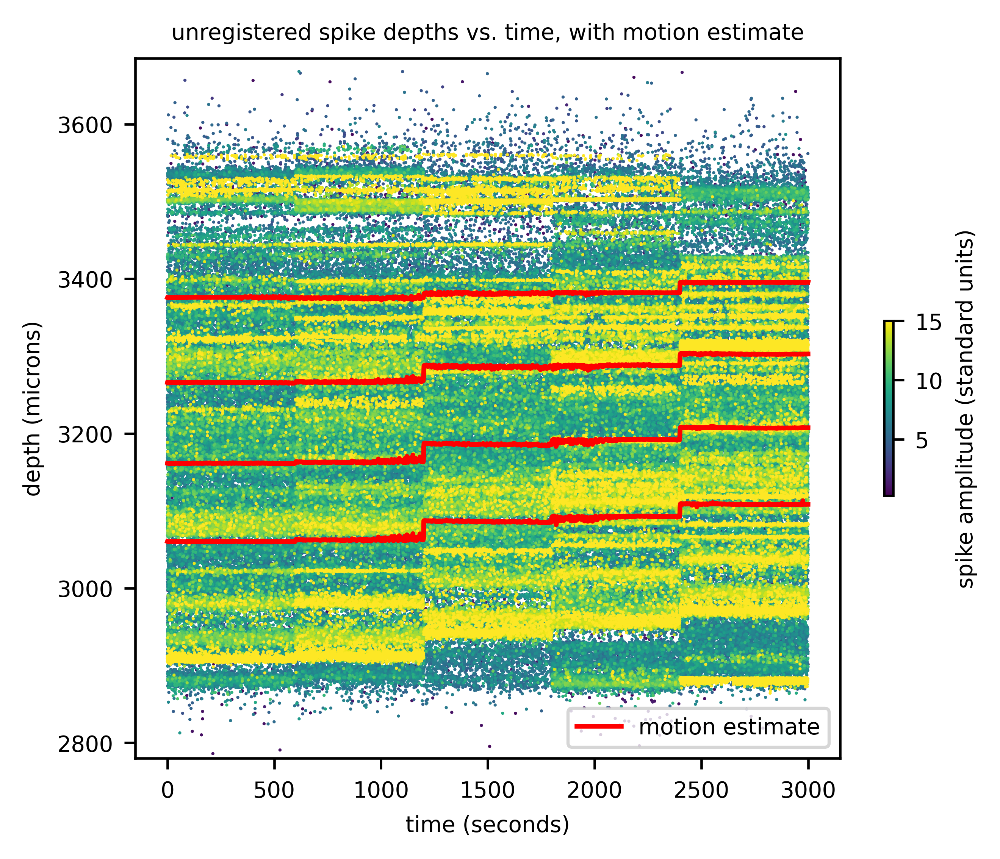

In [41]:
fig, ax = plt.subplots()
_, scatter = dartvis.scatter_time_vs_depth(hdf5_filename=hdf5_path, ax=ax);
plt.colorbar(scatter, ax=ax, shrink=0.25, label="spike amplitude (standard units)")
lines = motion_util.plot_me_traces(motion_est, ax, color="r")
ax.legend([lines[0]], ["motion estimate"], loc="lower right")
ax.set_xlabel("time (seconds)")
ax.set_ylabel("depth (microns)")
ax.set_title("unregistered spike depths vs. time, with motion estimate")

Text(0.5, 1.0, 'registered spike depths vs. time')

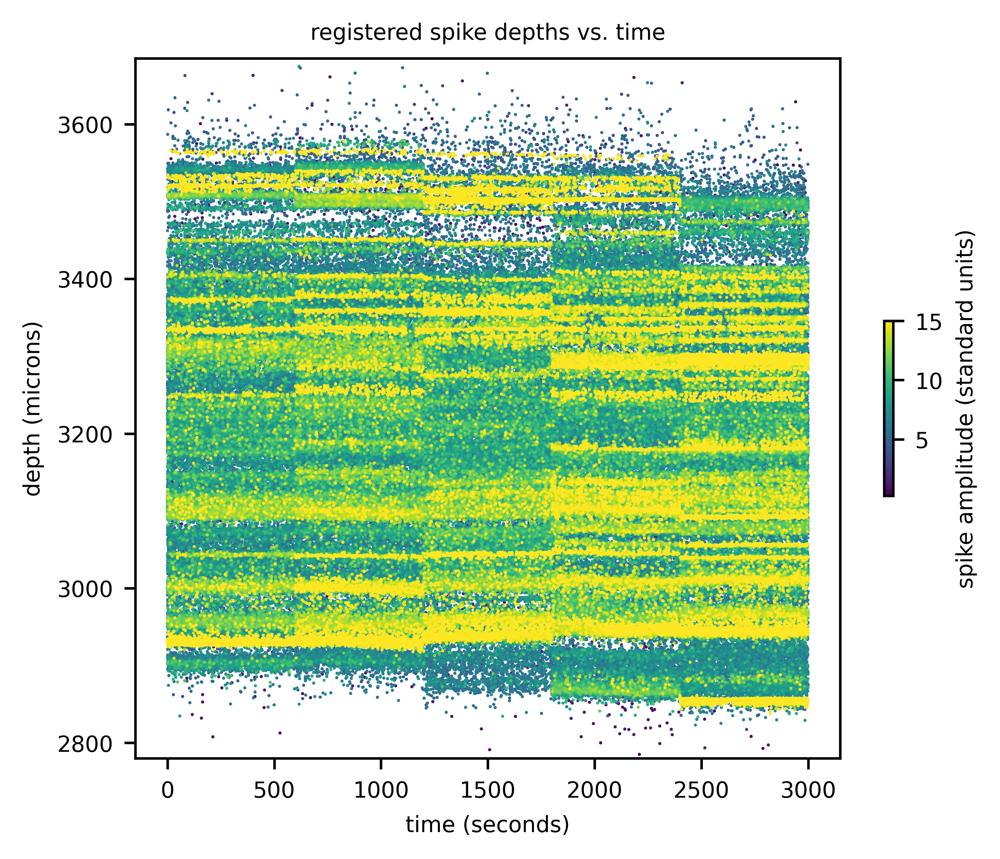

In [43]:
fig, ax = plt.subplots()
_, scatter = dartvis.scatter_time_vs_depth(
    hdf5_filename=hdf5_path,
    registered=True,
    motion_est=motion_est,
    ax=ax,
)
plt.colorbar(scatter, ax=ax, shrink=0.25, label="spike amplitude (standard units)")
ax.set_xlabel("time (seconds)")
ax.set_ylabel("depth (microns)")
ax.set_title("registered spike depths vs. time")